In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from sklearn.model_selection import train_test_split

In [ ]:
!pip install spacy
!python -m spacy download fr_core_news_md

2021-06-11 15:28:47.548779: W tensorflow/stream_executor/platform/default/dso_loader.cc:60] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2021-06-11 15:28:47.548834: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=50.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=50.0 (msgs/sec)
Notebook

In [ ]:
!pip install demoji
import demoji
demoji.download_codes()

... OK (Got response in 0.14 seconds)
Writing emoji data to /root/.demoji/codes.json ...
... OK


In [ ]:
import spacy
nlp = spacy.load('fr_core_news_md')

In [ ]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:
french = pd.read_csv('french_tweets.csv').sample(5000).reset_index(drop=True) # Dossier au dessus
french.label.value_counts()

0    2512
1    2488
Name: label, dtype: int64

In [ ]:
#def load_csv(filename, n):
    
    # Lecture en local
    file_path = "../raw_data/" + filename
    # Lecture dans le package
    #file_path = "../" + filename
    french = pd.read_csv(file_path, nrows = 2 * n)
    # Balanced binary classes
    positive = french[french.label == 1]
    negative = french[french.label == 0]
    # Subset creation
    positive = positive[:n].copy()
    negative = negative[:n].copy()
    # Concaténation
    frames = [positive, negative]
    subset = pd.concat(frames, axis=0)
    
    return subset

In [ ]:
# Exemple
# french_train_1 = load_csv("french_tweets.csv", n=1000)
#french_train_1 = load_csv("french_tweets.csv", 5000)

In [ ]:
# Check
#french_train_1.label.value_counts()

0    15000
1    15000
Name: label, dtype: int64

In [ ]:
french.head()

,label,text
0,1,"Finalement, j'ai pu télécharger Twitter! Toujo..."
1,0,Mes tweets n'auraient pas envoyé
2,1,hahahhahaha regarder BBF
3,1,Bon ta ... juste chillin out. T'es-tu? Au débu...
4,1,Mmmm vient de faire manger des agriculteurs


In [ ]:
french.isnull().sum()

label    0
text     0
dtype: int64

In [ ]:
french.isna().sum()

label    0
text     0
dtype: int64

<AxesSubplot:xlabel='label', ylabel='count'>

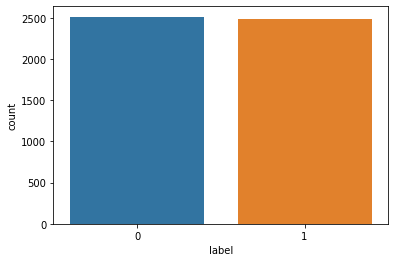

In [ ]:
sns.countplot(x='label',data=french)

In [ ]:
import string
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
from nltk.tokenize import TweetTokenizer
import demoji

stop = set(stopwords.words('french'))
nlp=spacy.load("fr_core_news_md")

#translator= Translator(to_lang="fr")

def clean_text(text):
    #replace emojis:
    #emojis=demoji.findall(text)
    #if emojis != {}:
        #for key,value in emojis.items():
            #Translator for emoji encoding in french:
            #value=translator.translate(value)
            #if key in text:
                #text=text.replace(key,value)
    # lower text
    text = text.lower()
    # remove puncutation
    for punctuation in string.punctuation.replace('#',''):
        text = text.replace(punctuation, ' ')
    # remove words that contain numbers
    text = ''.join(letter for letter in text if not letter.isdigit())
    #tokenization + remove stop words
    doc=nlp(text)
    lemmatized= [token.lemma_ for token in doc]
    # join all
    text = " ".join(lemmatized)
    
    return text


In [ ]:
french['clean_text'] = french['text'].apply(clean_text)

In [ ]:
french.head()

,label,text,clean_text
0,1,"Finalement, j'ai pu télécharger Twitter! Toujo...",finalement j avoir pouvoir télécharger twitt...
1,0,Mes tweets n'auraient pas envoyé,mon tweet n avoir pas envoyer
2,1,hahahhahaha regarder BBF,hahahhahaher regarder bbf
3,1,Bon ta ... juste chillin out. T'es-tu? Au débu...,bon ton juste chillin out t être taire ...
4,1,Mmmm vient de faire manger des agriculteurs,mmmm venir de faire manger un agriculteur


In [ ]:
french.shape

(5000, 3)

In [ ]:
## Deep Learning Model RNN

#### TO DO ####
"""
embedding_size = 50
model_rnn = Sequential()
model_rnn.add(layers.Embedding(
    input_dim=10_000,    # vocab_size
    input_length=50,     # sentences_lengths
    output_dim=20,       # embedding_size
    mask_zero=True))
model_rnn.add(layers.LSTM(10))
model_rnn.add(layers.Dense(1, activation="sigmoid")) # Classify binary task
"""
#### TO DO ####

'\nembedding_size = 50\nmodel_rnn = Sequential()\nmodel_rnn.add(layers.Embedding(\n    input_dim=10_000,    # vocab_size\n    input_length=50,     # sentences_lengths\n    output_dim=20,       # embedding_size\n    mask_zero=True))\nmodel_rnn.add(layers.LSTM(10))\nmodel_rnn.add(layers.Dense(1, activation="sigmoid")) # Classify binary task\n'

In [ ]:
## Deep Learning Model CNN

#embedding_size = 50
#model_cnn = Sequential()
#model_cnn.add(layers.Embedding(
#    input_dim=10_000,
#    input_length=50,
#    output_dim=20,
#    mask_zero=True))
#model_cnn.add(layers.Conv1D(10, kernel_size=2))
#model_cnn.add(layers.Flatten())
#model_cnn.add(layers.Dense(1, activation="sigmoid"))

# CNN

In [ ]:
!pip install gensim

In [ ]:
import gensim.downloader

print(list(gensim.downloader.info()['models'].keys()))

model_glove = gensim.downloader.load('glove-twitter-50')

['fasttext-wiki-news-subwords-300', 'conceptnet-numberbatch-17-06-300', 'word2vec-ruscorpora-300', 'word2vec-google-news-300', 'glove-wiki-gigaword-50', 'glove-wiki-gigaword-100', 'glove-wiki-gigaword-200', 'glove-wiki-gigaword-300', 'glove-twitter-25', 'glove-twitter-50', 'glove-twitter-100', 'glove-twitter-200', '__testing_word2vec-matrix-synopsis']


In [ ]:
index_to_key_set = set(model_glove.index_to_key)
len(index_to_key_set)

1193514

In [ ]:
model_glove['chat'] + model_glove['petit']

array([ 1.3311601 ,  0.34513998, -2.02161   ,  0.19575998,  0.36189002,
       -0.77443004,  0.56869   , -0.77207005,  0.47973   , -1.15048   ,
       -1.2058899 ,  0.00442004, -4.1349    , -1.25173   , -0.93736005,
        1.286863  ,  0.02275999, -0.80088   , -2.5006    , -0.16722101,
       -0.34709   , -0.421643  , -0.03806001, -1.260985  , -1.19354   ,
       -2.8876    ,  0.19507   , -0.08004999, -0.02192003,  0.466758  ,
       -0.16384998, -1.02877   , -2.00377   , -1.26857   ,  0.43131   ,
        0.62255   , -0.83612   , -1.3079    ,  1.23184   ,  0.21097499,
       -2.24237   , -1.67611   , -0.51865   ,  1.4893899 ,  0.40049   ,
        0.69718003, -0.29030997, -0.173416  ,  2.17859   , -1.98277   ],
      dtype=float32)

In [ ]:
# Function to convert a sentence (list of words) into a matrix representing the words in the embedding space
def embed_sentence_with_TF(word2vec, sentence):
    embedded_sentence = []
    for word in sentence:
        if word in word2vec:
            embedded_sentence.append(word2vec[word])
        
    return np.array(embedded_sentence)

# Function that converts a list of sentences into a list of matrices
def embedding(word2vec, sentences):
    embed = []
    
    for sentence in sentences:
        embedded_sentence = embed_sentence_with_TF(word2vec, sentence)
        embed.append(embedded_sentence)
        
    return embed

# Embed the training and test sentences
X_train_embed_2 = embedding(word2vec_transfer, X_train)
X_test_embed_2 = embedding(word2vec_transfer, X_test)

# Pad the training and test embedded sentences
X_train_pad_2 = pad_sequences(X_train_embed_2, dtype='float32', padding='post', maxlen=200)
X_test_pad_2 = pad_sequences(X_test_embed_2, dtype='float32', padding='post', maxlen=200)

NameError: name 'word2vec_transfer' is not defined

In [ ]:
def avg_sentence_vector(sentence, model, num_features):
    """returns a vectorized vector (for the next search-query)"""
    
    # splitting the sentence into a list of words
    words = sentence.split()
    # filling a ndarray of size num_features of zeros only
    sentence_vec = []
    
    # for each word in the sentence, adding the vectorized version of the word to the feature_vec
    for word in words:
        if word in index_to_key_set:
            sentence_vec.append(model[word])
    
    return sentence_vec

In [ ]:
french['vector_tweet'] = french['clean_text'].apply(lambda x : avg_sentence_vector(x, model_glove,50))

In [ ]:
french.label.value_counts()

0    2512
1    2488
Name: label, dtype: int64

In [ ]:
test_array = french['vector_tweet'].to_numpy()
test_array

array([list([array([ 0.55809  , -0.88542  , -1.0015   ,  0.8775   , -0.39177  ,
        0.71805  , -0.62979  ,  0.23358  ,  0.91109  ,  0.044995 ,
       -0.0068396, -0.64543  , -0.11067  , -0.024906 , -0.13143  ,
        1.5262   , -0.53354  ,  0.65207  , -1.7957   ,  0.82995  ,
        0.54087  , -0.8203   ,  0.23734  , -0.87189  , -0.48055  ,
       -0.35647  , -0.086524 , -0.30254  , -0.8839   ,  0.18291  ,
        0.33259  ,  0.13483  , -0.53106  , -0.6816   ,  0.13414  ,
        1.1809   , -0.69101  , -0.96726  ,  0.94399  ,  0.027842 ,
        0.2633   , -0.061206 , -0.26876  ,  0.9478   ,  0.12981  ,
        0.12386  , -0.33761  ,  0.32386  ,  0.61078  , -0.83387  ],
      dtype=float32), array([ 6.4814e-02, -1.0299e-01, -4.0971e-01, -2.3360e-01, -7.3669e-01,
        2.3948e-01, -2.9595e-01,  8.9506e-01,  1.8711e-01, -2.8006e-02,
       -2.9219e-01, -8.3930e-03, -3.1356e+00, -7.0252e-01, -4.6186e-01,
        4.3685e-01, -7.1584e-01,  7.7713e-02, -9.0696e-01,  1.9915e+00,
      

In [ ]:
for i in range(5):
    print(len(french['vector_tweet'].iloc[i]))

24
6
2
29
7


In [ ]:
list(french['vector_tweet'])

[[array([ 0.55809  , -0.88542  , -1.0015   ,  0.8775   , -0.39177  ,
          0.71805  , -0.62979  ,  0.23358  ,  0.91109  ,  0.044995 ,
         -0.0068396, -0.64543  , -0.11067  , -0.024906 , -0.13143  ,
          1.5262   , -0.53354  ,  0.65207  , -1.7957   ,  0.82995  ,
          0.54087  , -0.8203   ,  0.23734  , -0.87189  , -0.48055  ,
         -0.35647  , -0.086524 , -0.30254  , -0.8839   ,  0.18291  ,
          0.33259  ,  0.13483  , -0.53106  , -0.6816   ,  0.13414  ,
          1.1809   , -0.69101  , -0.96726  ,  0.94399  ,  0.027842 ,
          0.2633   , -0.061206 , -0.26876  ,  0.9478   ,  0.12981  ,
          0.12386  , -0.33761  ,  0.32386  ,  0.61078  , -0.83387  ],
        dtype=float32),
  array([ 6.4814e-02, -1.0299e-01, -4.0971e-01, -2.3360e-01, -7.3669e-01,
          2.3948e-01, -2.9595e-01,  8.9506e-01,  1.8711e-01, -2.8006e-02,
         -2.9219e-01, -8.3930e-03, -3.1356e+00, -7.0252e-01, -4.6186e-01,
          4.3685e-01, -7.1584e-01,  7.7713e-02, -9.0696e-01,  1

In [ ]:
from tensorflow.keras.preprocessing.sequence import pad_sequences
X_pad = pad_sequences(list(french['vector_tweet']), dtype='float32', padding='post', value= -1000, maxlen=280)

NameError: name 'french' is not defined

In [ ]:
X_pad.shape

(5000, 280, 50)

In [ ]:
X = X_pad
y = french['label']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

In [ ]:
X_train.shape

(3500, 280, 50)

In [ ]:
X_test.shape

(1500, 280, 50)

In [ ]:
from tensorflow.keras import layers, Sequential
from tensorflow.keras.layers import Flatten, Conv1D

model = Sequential()
model.add(layers.Masking(mask_value= -1000))
model.add(layers.Conv1D(16, 3))
model.add(layers.Flatten())
model.add(layers.Dense(5,))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

es = EarlyStopping(patience=5, restore_best_weights=True)

model.fit(X_train, y_train, 
          batch_size = 64,
          epochs=100,
          validation_split=0.3,
          callbacks=[es]
         )

Epoch 1/100
39/39 [==============================] - 2s 38ms/step - loss: 0.6953 - accuracy: 0.5327 - val_loss: 0.6857 - val_accuracy: 0.5752
Epoch 2/100
39/39 [==============================] - 2s 40ms/step - loss: 0.6519 - accuracy: 0.6234 - val_loss: 0.6707 - val_accuracy: 0.6067
Epoch 3/100
22/39 [===============>..............] - ETA: 0s - loss: 0.6137 - accuracy: 0.6557IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=50.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

39/39 [==============================] - 2s 55ms/step - loss: 0.6130 - accuracy: 0.6624 - val_loss: 0.6413 - val_accuracy: 0.6362
Epoch 4/100
39/39 [==============================] - 2s 49ms/step - loss: 0.5889 - accuracy: 0.6938 - val_loss: 0.6415 - val_accuracy: 0.6486
Epoch 5/100
29/39 [========

In [ ]:
res = model.evaluate(X_test, y_test, verbose=0)

In [ ]:
res

[0.6587599515914917, 0.6513333320617676]

In [ ]:
from tensorflow.keras import layers, Sequential

model_cnn = Sequential()
#model_cnn.add(layers.Embedding(input_dim=vocab_size + 1, output_dim=10, mask_zero=True, input_length=150))
model_cnn.add(layers.Conv1D(16, 3))
model_cnn.add(layers.Flatten())
model_cnn.add(layers.Dense(5,))
model_cnn.add(layers.Dense(1, activation='sigmoid'))

model_cnn.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

es = EarlyStopping(patience=5, restore_best_weights=True)

model_cnn.fit(X_train_pad, y_train, 
          batch_size = 32,
          epochs=100,
          validation_split=0.3,
          callbacks=[es]
         )

NameError: name 'X_train_pad' is not defined

In [ ]:
"""
from tensorflow.keras import layers, Sequential

# Size of your embedding space = size to represent each word
embedding_size = 20

model_cnn = Sequential()
model_cnn.add(layers.Embedding(
    input_dim=vocab_size+1,      # 16 + 1 for the 0 padding
    input_length=8,              # Max_sentence_length (optional, for model summary)
    output_dim=embedding_size,   # 20
    mask_zero=True,              # Included masking layer
))

model_cnn.add(layers.LSTM(20))
model_cnn.add(layers.Dense(1, activation="sigmoid"))
"""

In [ ]:
print("\n ######## CNN ##########")
print(model_cnn.summary())

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=ce82c844-fa70-433d-b480-148c6a0f0f8b' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>